In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import pprint
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import pyplot as plt


base = r"D:/ENTC/SEM_4/EN2550 - Fundamentals of Image Processing and Machine Vision/~images/";

(256,)


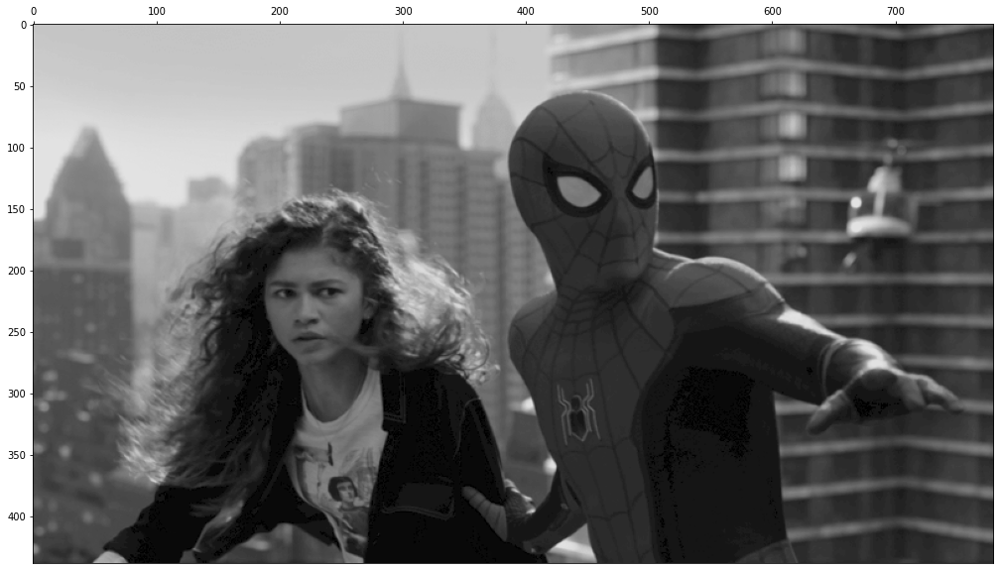

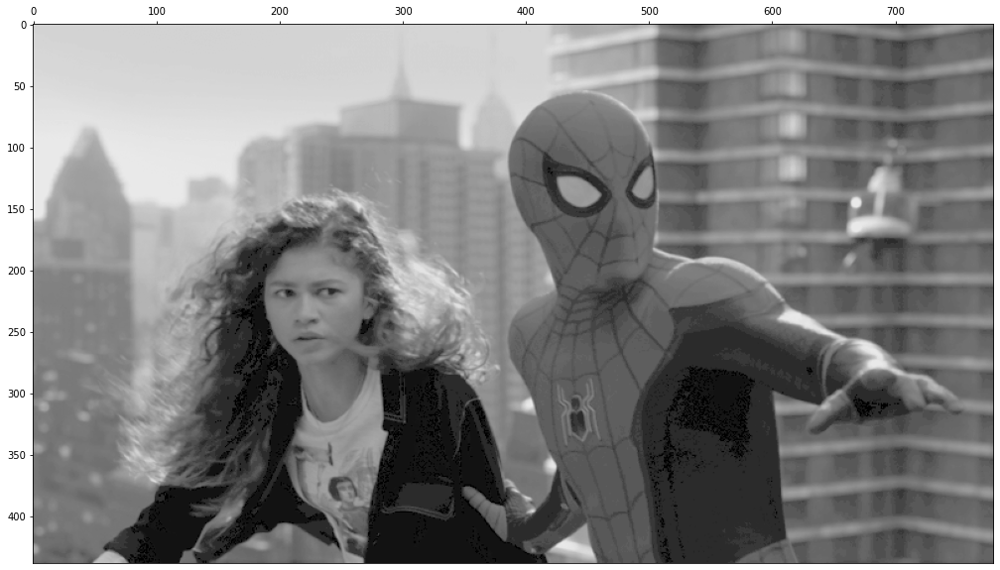

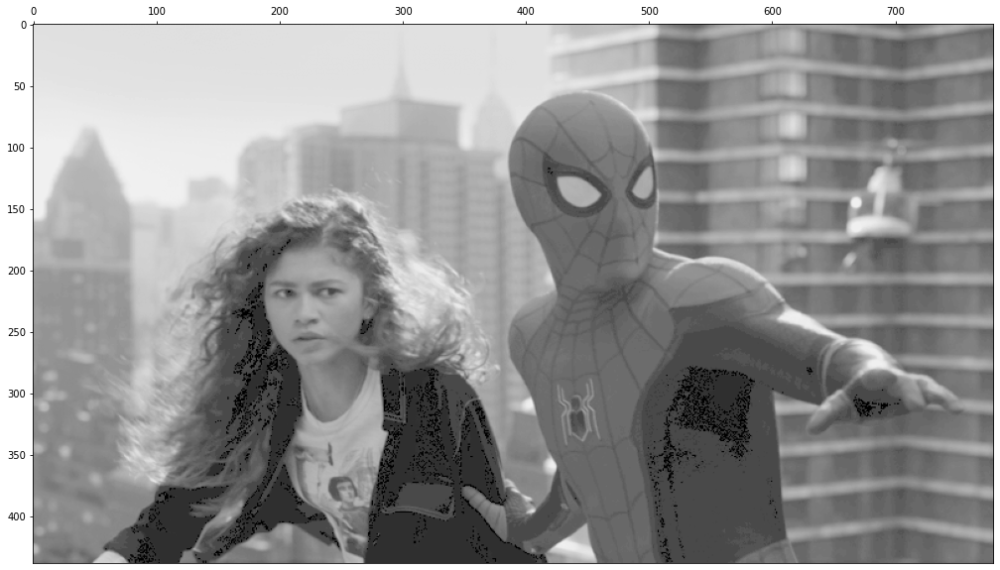

In [2]:
img1 = cv.imread(base + "spider.png",cv.IMREAD_GRAYSCALE)
assert img1 is not None;

fig,ax = plt.subplots(figsize=(20,10))
ax.imshow(img1,cmap = "gray", vmax=255,vmin = 0)
ax.xaxis.tick_top()


t1 = np.linspace(0,100,50);
t2  =  np.linspace(100,255,256-50)
t = np.concatenate((t1,t2),axis=0)

img2 = cv.LUT(img1,t)

fig,ax = plt.subplots(figsize=(20,10))
ax.imshow(img2,cmap = "gray", vmax=255,vmin = 0)
ax.xaxis.tick_top()

tGamma = np.array([255*(i/255)**0.5 for i in range(0,256)]).astype(np.uint8);
print(tGamma.shape)
img3 = cv.LUT(img1,tGamma)

fig,ax = plt.subplots(figsize=(20,10))
ax.imshow(img3,cmap = "gray", vmax=255,vmin = 0)
ax.xaxis.tick_top()

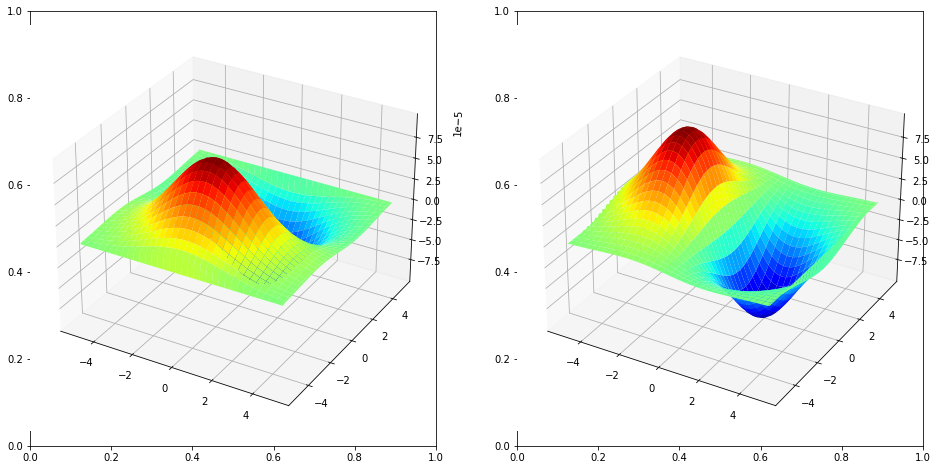

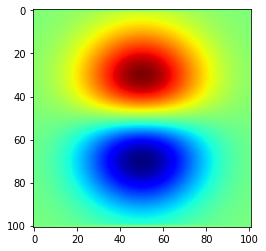

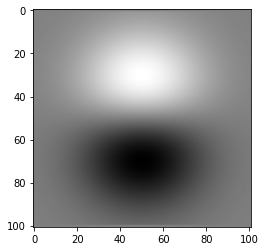

In [3]:

step =0.1
X = np.arange(-5,+5+step,step);
Y = np.arange(-5,+5+step,step);
XX,YY = np.meshgrid(X,Y);

sigma = 2

g = np.exp(-1*(XX**2 + YY**2) / (2*sigma**2) )
g /= np.sum(g)



sobelV = np.array([[-1,-2,-1],[0,0,0],[1,2,1]],dtype=np.float32)
sobelH = sobelV.T
g_x = cv.filter2D(g,-1,sobelV)
g_y = cv.filter2D(g,-1,sobelH)


fig,ax = plt.subplots(1,2,figsize=(16,8))
ax1 = fig.add_subplot(121,projection='3d')
ax2 = fig.add_subplot(122,projection='3d')

surf1 = ax1.plot_surface(XX,YY,g_x,cmap=cm.jet,antialiased=True,linewidth=0);
surf2 = ax2.plot_surface(XX,YY,g_y,cmap=cm.jet,antialiased=True,linewidth=0);

plt.show()

show= g_x


fig,ax = plt.subplots();
ax.imshow(show,cmap="jet")

fig,ax = plt.subplots();
ax.imshow(show,cmap="gray")

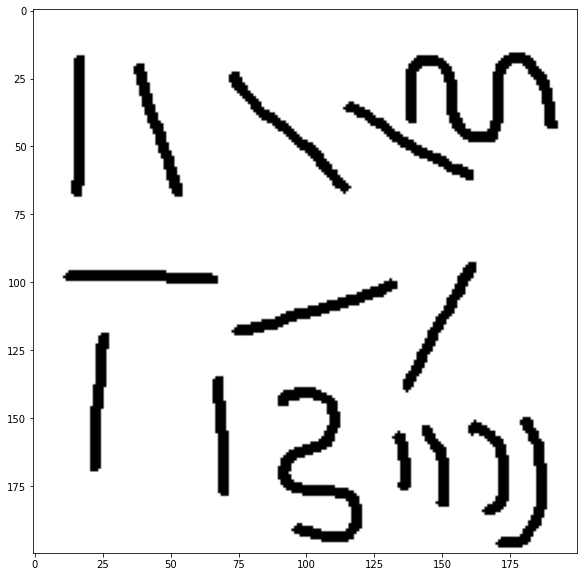

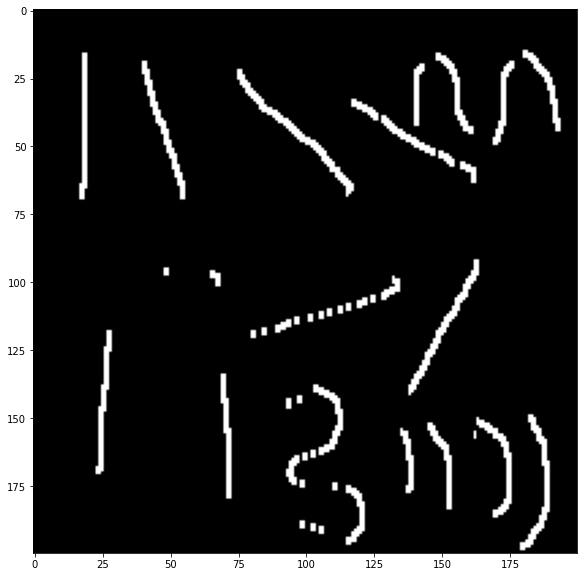

In [4]:
img = cv.imread(base + "shapes.png", cv.IMREAD_GRAYSCALE)
assert img is not None;

img_g_x = cv.filter2D(img,-1,sobelV)
img_g_y = cv.filter2D(img,-1,sobelH)
img_grad  = np.sqrt(img_g_x**2+img_g_y**2).astype(np.float32)

fig,ax = plt.subplots(figsize=(20,10));
ax.imshow(img,cmap="gray")


fig,ax = plt.subplots(figsize=(20,10));
ax.imshow(img_g_y,cmap="gray")

True

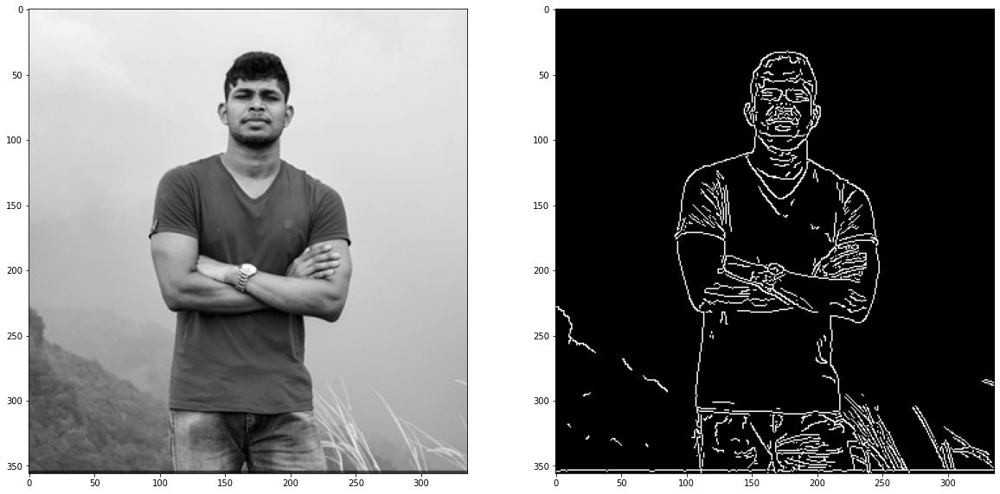

In [5]:
img = cv.imread(base + "r3ki3g.jpeg",cv.IMREAD_GRAYSCALE)
assert img is not None;
edges = cv.Canny(img,100,150)


fig,ax =plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(img,cmap="gray")
ax[1].imshow(edges,cmap="gray")

cv.imwrite(base + "res/edges.png",edges)

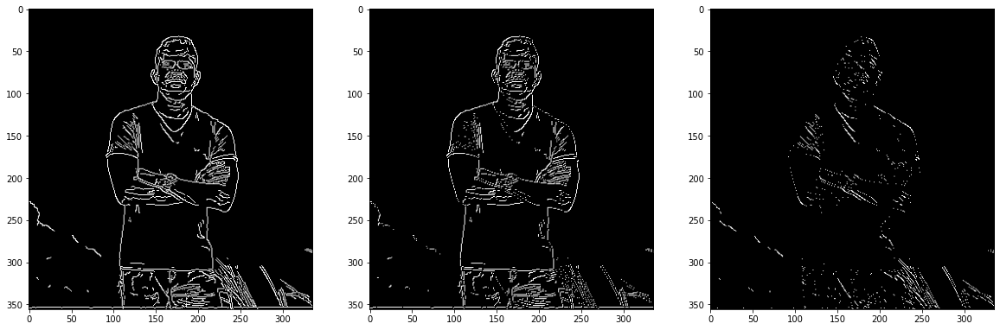

In [6]:
diagonal_kernel = np.array([[0,2,2,2,3],
                   [-2,0,1,1,2],
                  [-2,-1,0,1,2],
                  [-2,-1,-1,0,2],
                  [-3,-2,-2,-2,0]]).astype(np.float32);
diagonal_kernel = np.array([[-1,0],
                           [0,1]]).astype(np.float32)
diagonal_edges = cv.filter2D(edges,-1,diagonal_kernel)



difference = diagonal_edges - edges


fig,ax =plt.subplots(1,3,figsize=(20,10))
ax[0].imshow(edges,cmap="gray")
ax[1].imshow(diagonal_edges,cmap="gray")
ax[2].imshow(difference,cmap="gray")

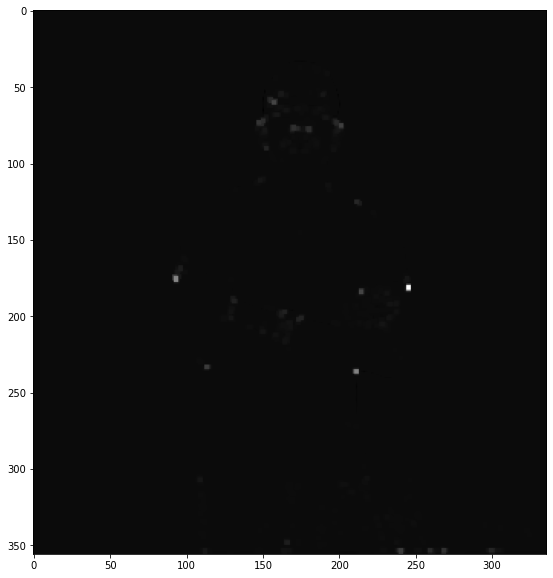

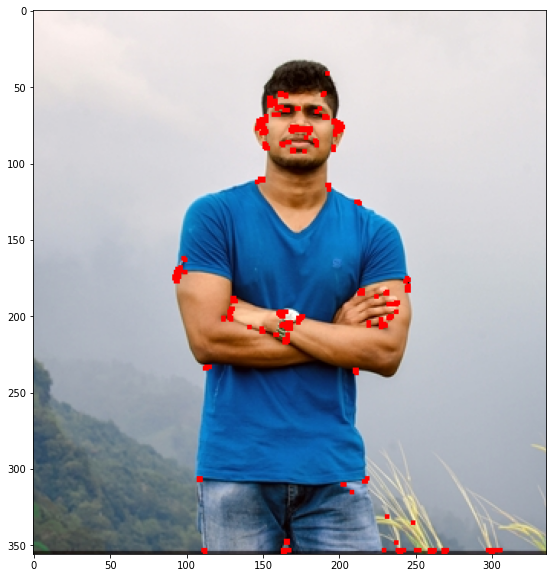

In [7]:
img = cv.imread(base + "r3ki3g.jpeg",cv.IMREAD_COLOR)
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
assert img is not None
gray = cv.cvtColor(img,cv.COLOR_RGB2GRAY).astype(np.float32)
dst = cv.cornerHarris(gray,2,3,0.04)

dst = cv.dilate(dst,None)
img[dst>0.01*dst.max()] = [255,0,0]

fig,ax = plt.subplots(figsize=(10,10));
ax.imshow(dst,cmap="gray")
fig,ax = plt.subplots(figsize=(10,10));
ax.imshow(img)

sum of products: 0.060710941680042804


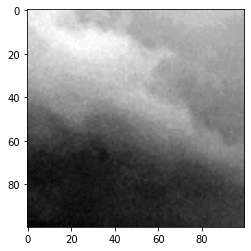

In [8]:
img = cv.imread(base + "r3ki3g.jpeg",cv.IMREAD_GRAYSCALE)
assert img is not None;

w = img[0:100,0:100]
sobelV = np.array([[-1,-2,-1],[0,0,0],[1,2,1]],dtype=np.float32);sobelH=sobelV.T

w_x = cv.filter2D(w,-1,sobelV)
w_y = cv.filter2D(w,-1,sobelH)

sum_wx_wy_products = np.sum(w_x*w_y)/(img.shape[0]*img.shape[1])
print("sum of products:",sum_wx_wy_products)

fig,ax = plt.subplots()
ax.imshow(w,cmap="gray")



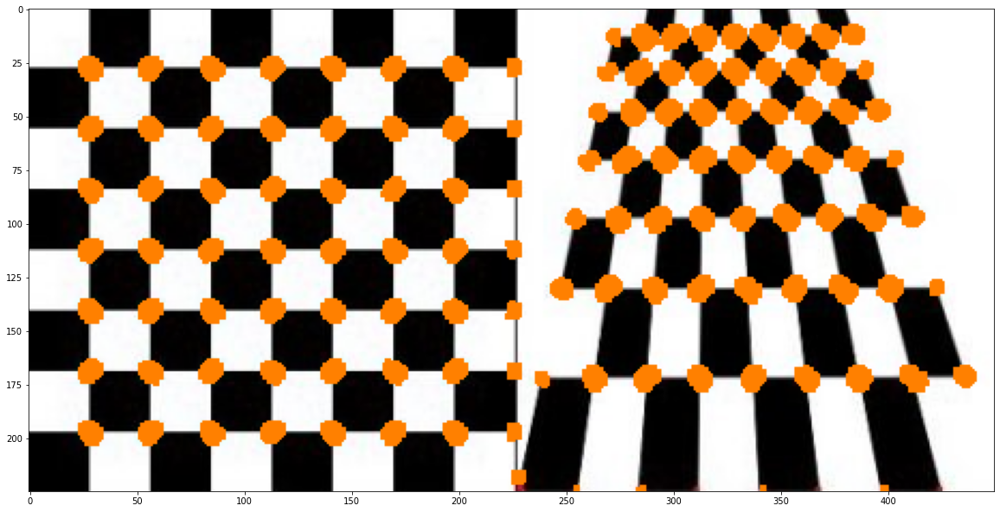

In [9]:
img = cv.imread(base + "r3_corner.jpg",cv.IMREAD_COLOR)
assert img is not None;
imgGray =  cv.cvtColor(img,cv.COLOR_BGR2GRAY);

dst = cv.cornerHarris(imgGray,5,3,0.04);
dst = cv.dilate(dst,None);

img[dst > dst.max() * 0.01] = [0,128,255]
img =  cv.cvtColor(img,cv.COLOR_BGR2RGB);


fig,ax = plt.subplots(figsize=(20,20));
ax.imshow(img)

## open cv cornerHarris()
https://docs.opencv.org/4.x/dc/d0d/tutorial_py_features_harris.html

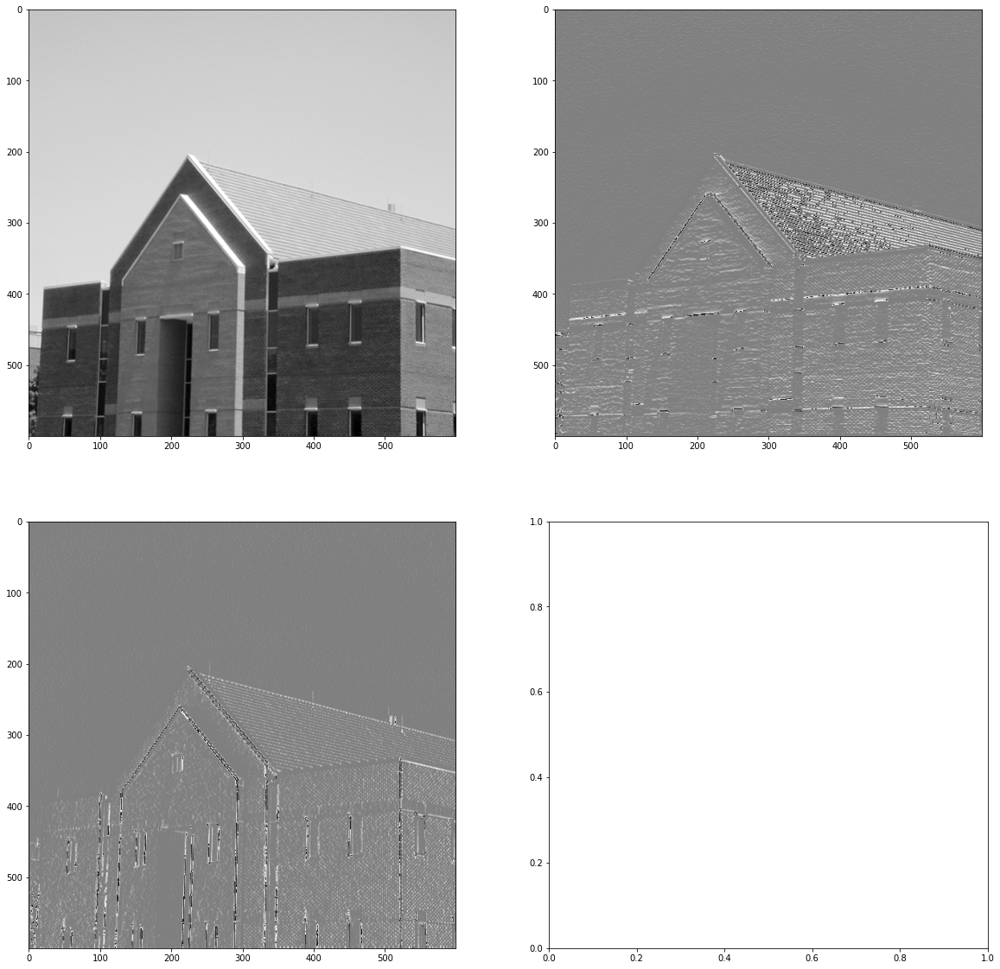

In [10]:
from skimage.feature import peak_local_max
img = cv.imread(base + "building.tif",cv.IMREAD_COLOR)
assert img is not None;
imgGray =  cv.cvtColor(img,cv.COLOR_BGR2GRAY);

I = imgGray
Ix = cv.filter2D(I,-1,sobelV)
Iy = cv.filter2D(I,-1,sobelH)

finiteInterval2DSummer  = np.ones((7,7))


sigma=3
ksize = 7
m11 = cv.GaussianBlur(Ix**2,(ksize,ksize),sigma)
m12 = cv.GaussianBlur(Ix*Iy,(ksize,ksize),sigma)
m21 = m12
m22 = cv.GaussianBlur(Iy**2,(ksize,ksize),sigma)

# m11 = cv.filter2D(Ix**2,-1,finiteInterval2DSummer)
# m12 = cv.filter2D(Ix*Iy,-1,finiteInterval2DSummer)
# m21 = m12
# m22 = cv.filter2D(Iy**2,-1,finiteInterval2DSummer)

det = m11*m22 - m12*m21
trace = m11+m22
alpha=0.04
R = det - alpha*trace**2
R[R<1e8] = 0
coordinates = peak_local_max(R,min_distance = 2)

fig,ax = plt.subplots(2,2,figsize=(20,20))
ax[0,0].imshow(imgGray, cmap="gray")
ax[0,0].plot(coordinates[:,1], coordinates[:,0], 'r.')
ax[0,1].imshow(Ix+127, cmap="gray")
ax[1,0].imshow(Iy+127, cmap="gray")




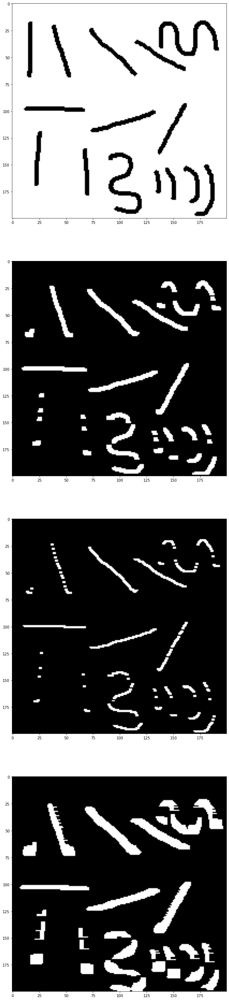

In [11]:

img =  cv.imread(base + 'shapes.png',0)
assert img is not None;

g1D = cv.getGaussianKernel(31,10)

g2D = g1D @ g1D.T
g2D /= np.sum(g2D)


kwidth = 11


mb = np.array([1,2,3,4,5,6,6,6,6,6,7],dtype=np.float32)
mb/=np.sum(mb);


kernel_1 = np.array([[-2,-2,-2,-2,-2],
                     [-1,-1,-1,-1,-1],
                     [0,0,0,0,0],
                     [1,1,1,1,1],
                     [2,2,2,2,2]]);


kernel_2 = np.array([[-1,-1,-1],
                    [0,0,0],
                    [1,1,1]]);

kernel_3 = np.array([[-1]*9,
                     [0]*9,
                     [0]*9,
                     [0]*9,
                     [0]*9,
                     [0]*9,
                     [0]*9,
                     [0]*9,
                     [0]*9,
                     [1]*9]);


img2 = cv.filter2D(img,-1,kernel_1)
img3 = cv.filter2D(img,-1,kernel_2)
img4 = cv.filter2D(img,-1,kernel_3)


fig,ax = plt.subplots(4,1,figsize=(20,50))

img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
ax[0].imshow(img);

img2 = cv.cvtColor(img2,cv.COLOR_BGR2RGB)
ax[1].imshow(img2);
img3 = cv.cvtColor(img3,cv.COLOR_BGR2RGB)
ax[2].imshow(img3);


img4 = cv.cvtColor(img4,cv.COLOR_BGR2RGB)
ax[3].imshow(img4);


motion blur kernel:
[[0.4 0.2 0.  0.  0. ]
 [0.  0.2 0.  0.  0. ]
 [0.  0.  0.2 0.  0. ]
 [0.  0.  0.  0.  0. ]
 [0.  0.  0.  0.  0. ]]


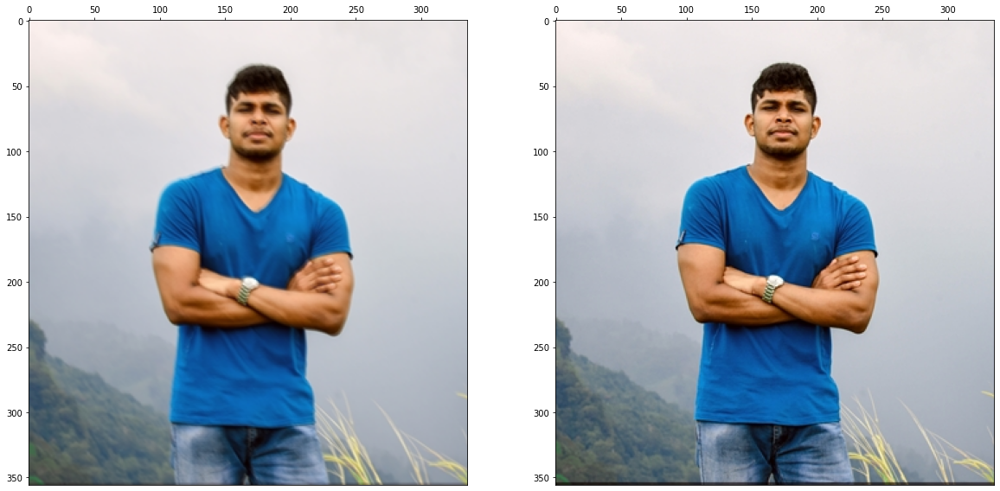

In [12]:
img = cv.imread(base + "r3ki3g.jpeg",1);
assert img is not None;

mbKernel = np.array([[10,5,0,0,0],
                    [0,5,0,0,0],
                    [0,0,5,0,0],
                    [0,0,0,0,0],
                    [0,0,0,0,0]],dtype=np.float32)
mbKernel /= np.sum(mbKernel)

print("motion blur kernel:")
print(mbKernel)

motionBlured = cv.filter2D(img,-1,mbKernel)


motionBlured = cv.cvtColor(motionBlured,cv.COLOR_BGR2RGB)
img = cv.cvtColor(img,cv.COLOR_BGR2RGB)

fig,ax = plt.subplots(1,2,figsize=(20,20))
ax[0].imshow(motionBlured,cmap="gray")
ax[1].imshow(img);
ax[0].xaxis.tick_top()
ax[1].xaxis.tick_top()


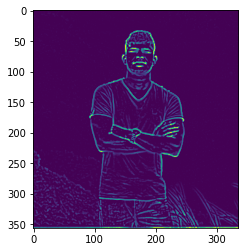

In [13]:
img = cv.imread(base + "r3ki3g.jpeg",0)
assert img is not None

x = np.arange(-60,60+1,1)
y = np.arange(-60,60+1,1)

sigma = 1
X,Y = np.meshgrid(x,y)

log = (X**2 + Y**2 - 2*sigma**2) * np.exp(-(X**2+Y**2)/(2*sigma**2))
plt.imshow(log)

img = cv.filter2D(img,-1,log)
plt.imshow(img)

Max value is at sigma = 6
radius guess = 8.485281374238571
radius = 9


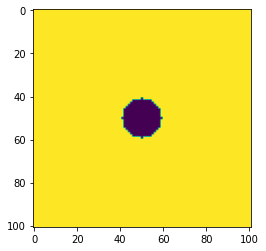

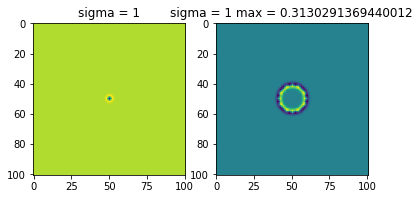

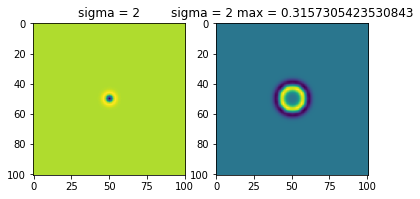

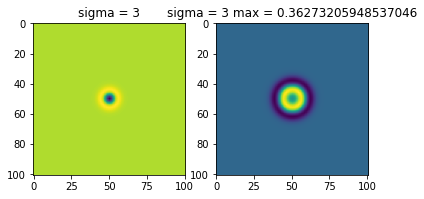

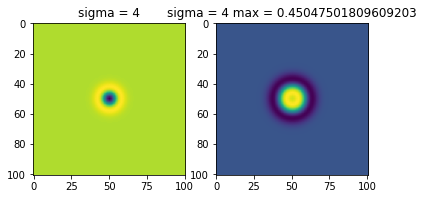

...

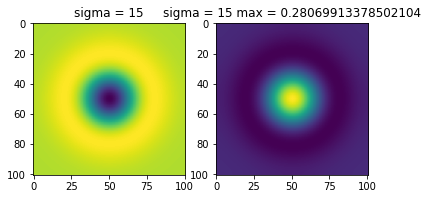

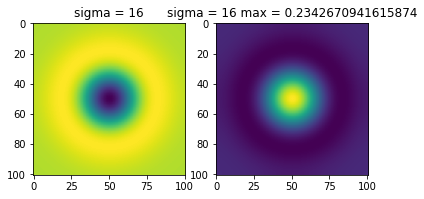

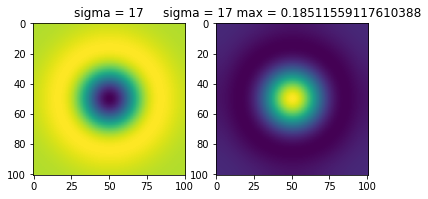

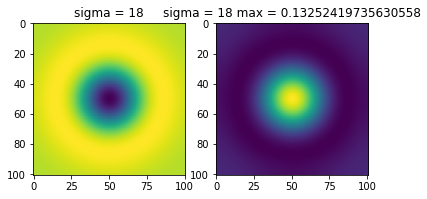

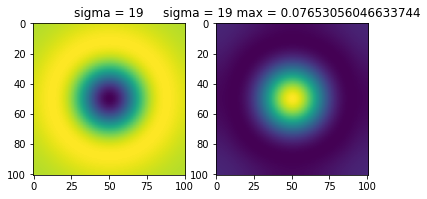

In [14]:
h=w=100
im = np.ones((h,w))
x= np.arange(-h//2,h//2+1,1)
y= np.arange(-w//2,w//2+1,1)

X,Y = np.meshgrid(x,y)


radius = 9

im = np.ones(X.shape)
im *= X**2+Y**2>radius**2

plt.imshow(im)

sigmas = np.arange(1,20,1)
temMaxVal = 0;
tempMaxValAt = 0;
for sigma in sigmas:
    NLoG = (1/ (2*np.pi*sigma**2) ) * (np.exp((-(X**2+Y**2))/(2*sigma**2))) * ((X/sigma)**2 + (Y/sigma)**2 - 2)
    result = cv.filter2D(im,-1,NLoG)
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(NLoG)
    ax[0].set_title("sigma = " + str(sigma))
    
    ax[1].imshow(result)
    ax[1].set_title("sigma = " + str(sigma) + " max = " + str(np.max(result)))

    if temMaxVal < np.max(result):
        temMaxVal =  np.max(result);
        tempMaxValAt = sigma;


print("Max value is at sigma = " + str(tempMaxValAt))
print("radius guess = " + str(tempMaxValAt*np.sqrt(2)))
print("radius = " + str(radius))


Max value is at sigma = 9
radius guess = 12.727922061357857
radius = 9


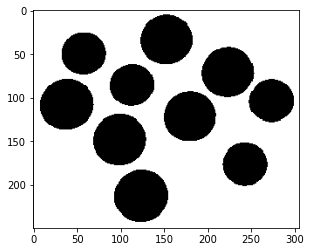

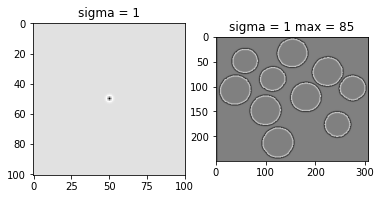

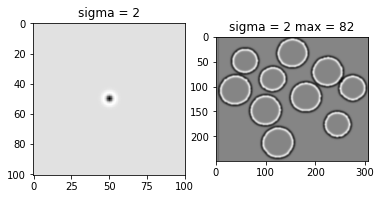

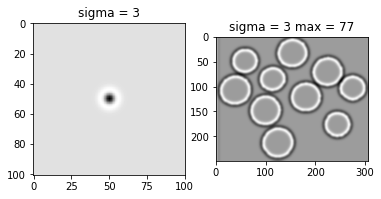

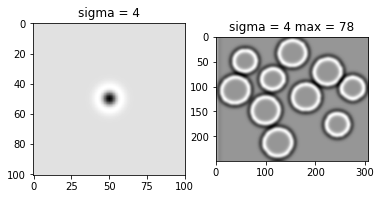

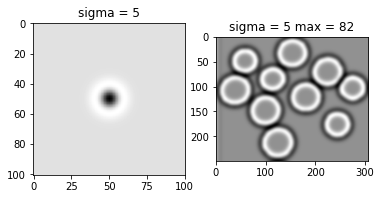

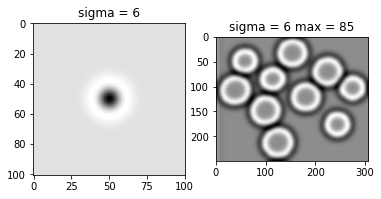

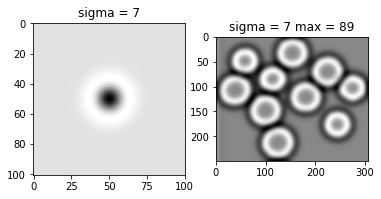

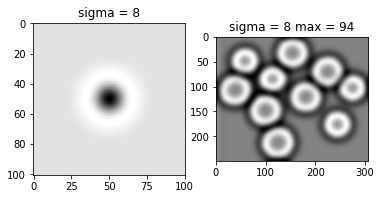

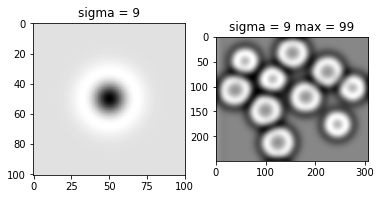

In [15]:
h=w=100


im = cv.imread(base + "blob.png",0)
invertT = np.arange(255,-1,-1)
assert invertT.shape[0] == 256

im = cv.LUT(im,invertT)
plt.imshow(im,cmap="gray")

sigmas = np.arange(1,10,1)
temMaxVal = 0;
tempMaxValAt = 0;
for sigma in sigmas:
    NLoG = (1/ (2*np.pi*sigma**2) ) * (np.exp((-(X**2+Y**2))/(2*sigma**2))) * ((X/sigma)**2 + (Y/sigma)**2 - 2)
    result = cv.filter2D(im,-1,NLoG)
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(NLoG,cmap="gray")
    ax[0].set_title("sigma = " + str(sigma))
    
    ax[1].imshow(result,cmap="gray")
    ax[1].set_title("sigma = " + str(sigma) + " max = " + str(np.max(result)))

    if temMaxVal < np.max(result):
        temMaxVal =  np.max(result);
        tempMaxValAt = sigma;


print("Max value is at sigma = " + str(tempMaxValAt))
print("radius guess = " + str(tempMaxValAt*np.sqrt(2)))
print("radius = " + str(radius))


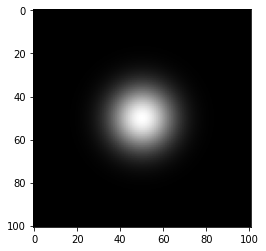

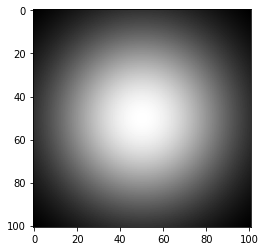

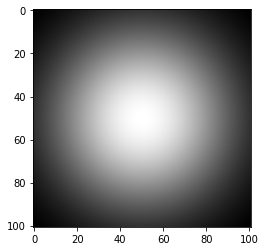

In [16]:
hh=hw=50
x = np.arange(-hh,hh+1,1)
y = np.arange(-hw,hw+1,1)

X,Y = np.meshgrid(x,y)

sigma = 10
g1 =  np.exp(-(X**2+Y**2)/(2*sigma**2))
g1 /=  np.sum(g1)


sigma = 30
g2 =  np.exp(-(X**2+Y**2)/(2*sigma**2))
g2 /=  np.sum(g1)


plt.imshow(g1,cmap="gray")
plt.show()
plt.imshow(g2,cmap="gray")
plt.show()
plt.imshow(g2-2*g1,cmap="gray")
plt.show()

### experiment - intensity gradual change



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(356, 336, 3)

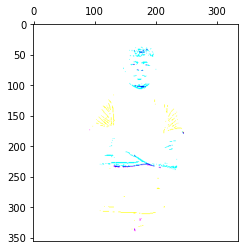

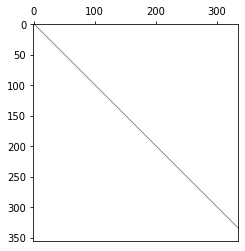

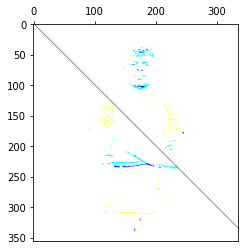

In [17]:
img =  cv.imread(base + "r3ki3g.jpeg")
assert img is not None

img = img.astype(np.float32)

fig,ax = plt.subplots()
ax.imshow(img,cmap="gray")
ax.xaxis.tick_top()

# inMap 
inMap_x = np.arange(0,img.shape[0]).astype(np.float32)
inMap_y = np.arange(0,img.shape[1]).astype(np.float32)
inMap_X ,inMap_Y = np.meshgrid(inMap_x,inMap_y)
inMap_X = inMap_X.T
inMap_Y = inMap_Y.T
inMap = abs(inMap_X-inMap_Y)
inMap = cv.merge((inMap,inMap,inMap))
fig,ax = plt.subplots()
ax.imshow(inMap,cmap="gray")
ax.xaxis.tick_top()

dstImg = img*inMap
fig,ax = plt.subplots()
ax.imshow(dstImg,cmap="gray")
ax.xaxis.tick_top()


img.shape

[[100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]
 [100 101 102 103 104 105 106 107 108 109 110]]


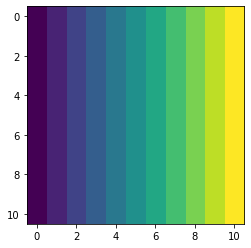

In [18]:
x  = np.arange(-5,5+1,1)
y =  np.arange(100,110+1,1)

X,Y = np.meshgrid(x,y)
X=X.T
Y=Y.T
print(Y)
plt.imshow(Y)

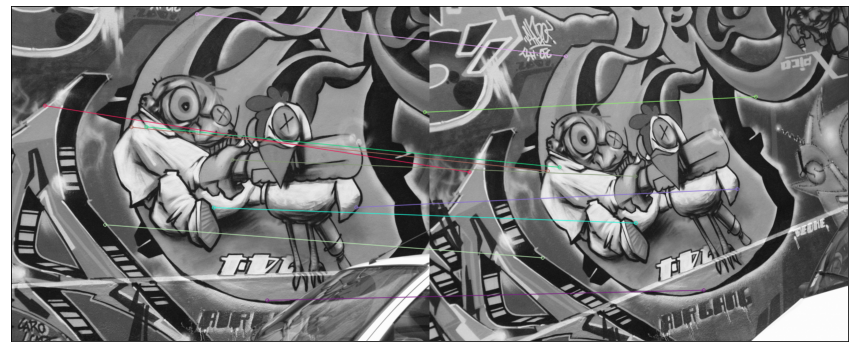

In [19]:
img1 = cv.imread(r'D:/ENTC/SEM_4/EN2550 - Fundamentals of Image Processing and Machine Vision/~images/img1.ppm',cv.IMREAD_COLOR)  
img2 = cv.imread(r'D:/ENTC/SEM_4/EN2550 - Fundamentals of Image Processing and Machine Vision/~images/img2.ppm',cv.IMREAD_COLOR) 

img1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

sift = cv.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:10], img2, flags=2)
plt.figure(figsize=(15,15))
plt.imshow(img3)
plt.xticks([]), plt.yticks([])
plt.show()

m= -1.7844580696999723 b= -10.181145740353067


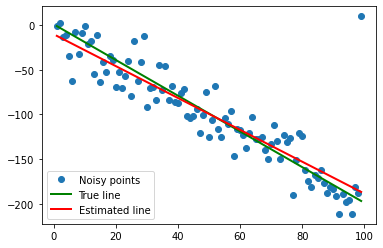

In [20]:
m =-2 #gradient
c = 1 #intercept
x = np.arange(1,100,1)



np.random.seed(45)
noise= np.random.randn(len(x)) * np.max(x) * 0.2
n = 2.*np.random.randn(len(x))
o = np.zeros(x.shape)
y = m*x + c + noise + o

y[-1] = 10

n=len(x)
X=np.concatenate([x.reshape(n,1),np.ones((n,1))],axis=1)
B=np.linalg.pinv(X.T @ X) @ X.T @ y
mstar=B[0]
cstar=B[1]


plt.plot(x,y,'o',label='Noisy points')
plt.plot([x[0],x[-1]],[m*x[0]+c,m*x[-1]+c],color='g',linewidth=2,label=r'True line')
plt.plot([x[0],x[-1]],[mstar*x[0]+cstar,mstar*x[-1]+cstar],color='r',linewidth=2,label=r'Estimated line')

plt.legend()

print("m=",mstar,"b=",cstar)

# convolving with random kernel

[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
[[-0.07791751 -0.14740615  0.29174605  0.33896527 -0.44799541]
 [-0.22024761  0.11514749  0.14611286 -0.24358826  0.0210171 ]
 [-0.194243   -0.42392391  0.29948016  0.02955632 -0.28426298]
 [ 0.47422176  0.25036515 -0.21005528 -0.02263587  0.16222314]
 [ 0.33474897 -0.1940345  -0.05127614  0.36131895 -0.30731661]]


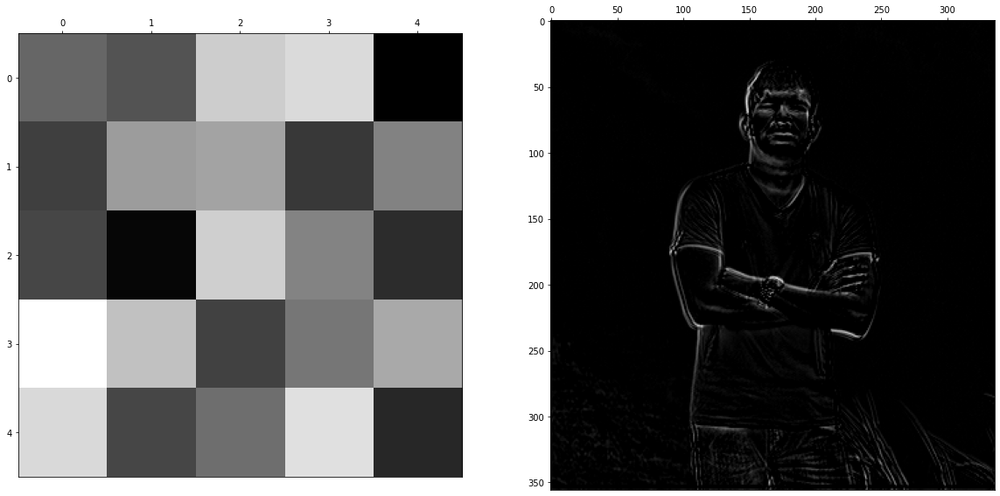

In [21]:
import scipy.signal as sig

img = cv.imread(base + "r3ki3g.jpeg",0)
# img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
for i in range(1):
    ksize = 5
    kernel = np.random.rand(ksize,ksize)
    kernel -= np.sum(kernel)/ksize**2
    
    impulse2D = np.zeros((ksize,ksize),dtype=np.float32)
    impulse2D[ksize//2,ksize//2] = 1
    print(impulse2D)
    print(kernel)
#     inverse_kernel = sig.deconvolve(impulse2D,kernel)
    #print(kernel)

    dst = cv.filter2D(img,-1,kernel)
    fig,ax = plt.subplots(1,2,figsize=(20,10))
    ax[0].imshow(kernel,cmap= "gray")
    ax[1].imshow(dst,cmap="gray")
    ax[0].xaxis.tick_top()
    ax[1].xaxis.tick_top()
    plt.show()

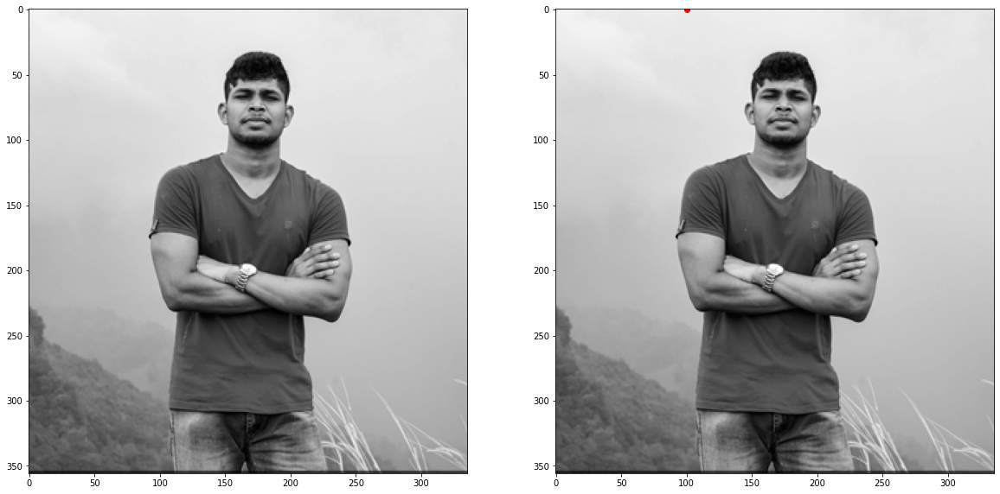

In [22]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(img,cmap= "gray")
ax[1].imshow(img,cmap= "gray")

ax[1].plot(100,0,'o',color="red")

plt.show();


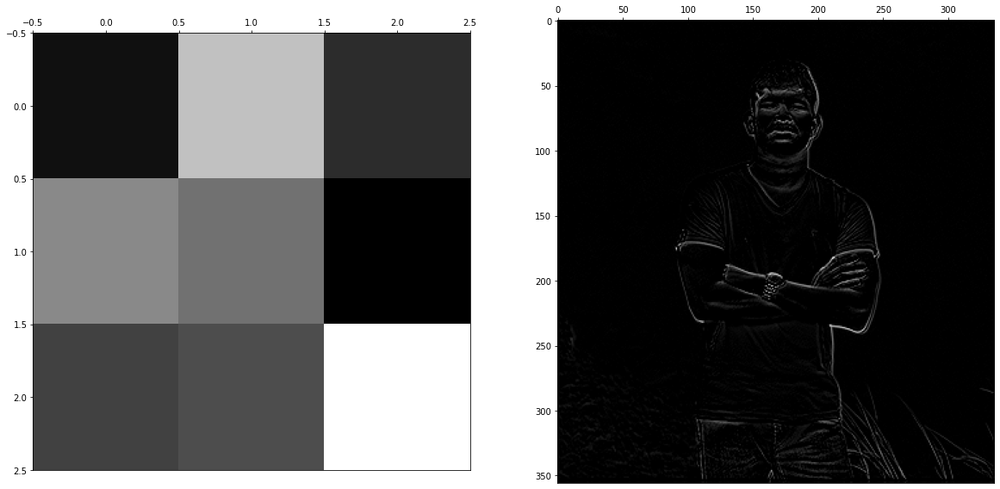

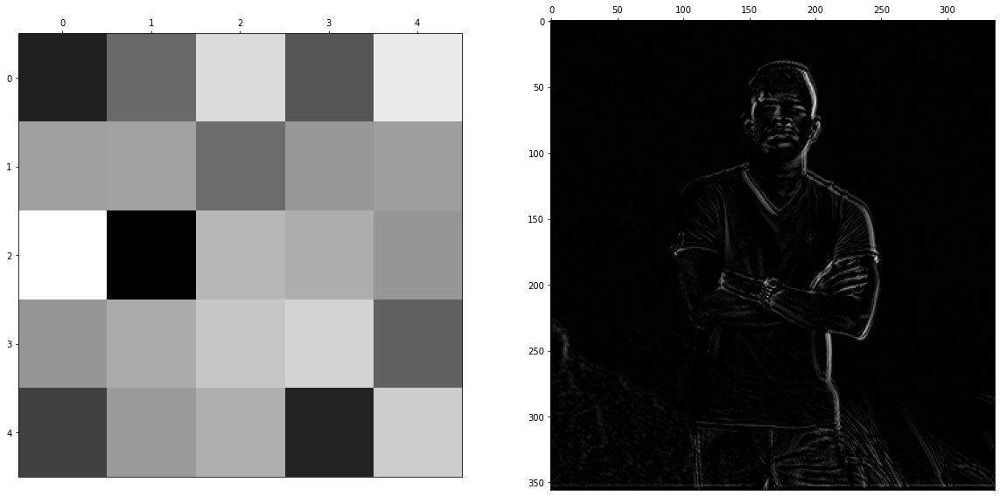

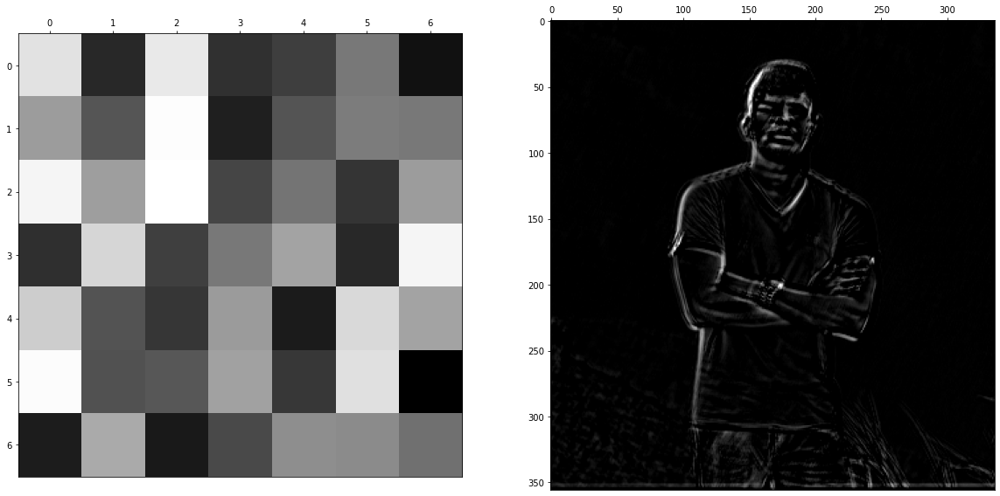

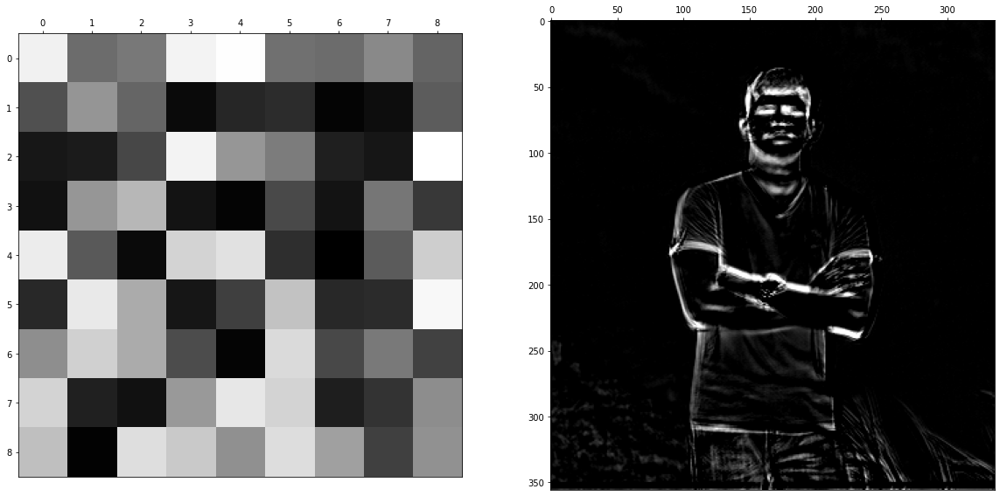

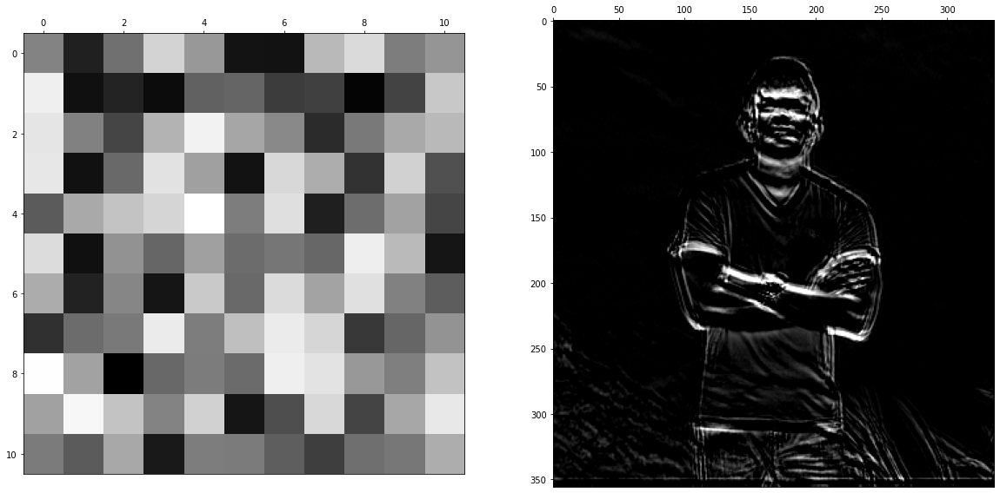

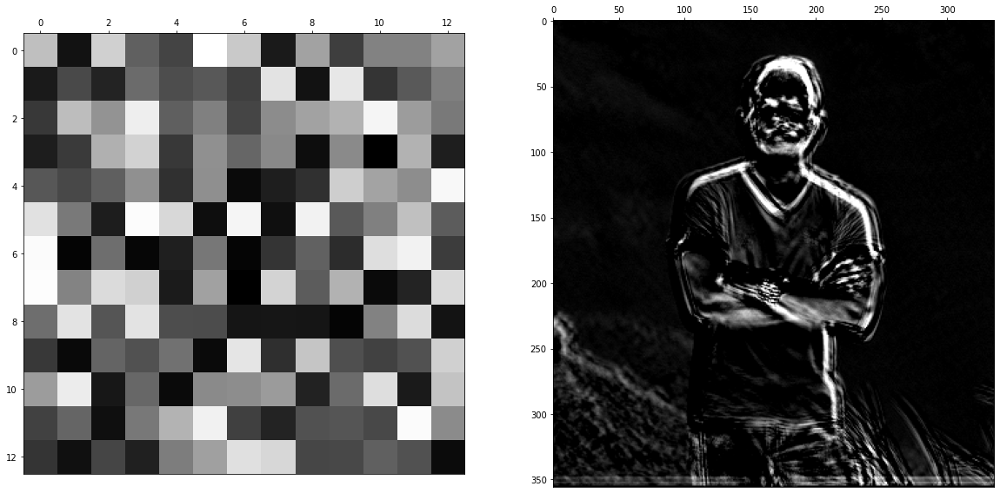

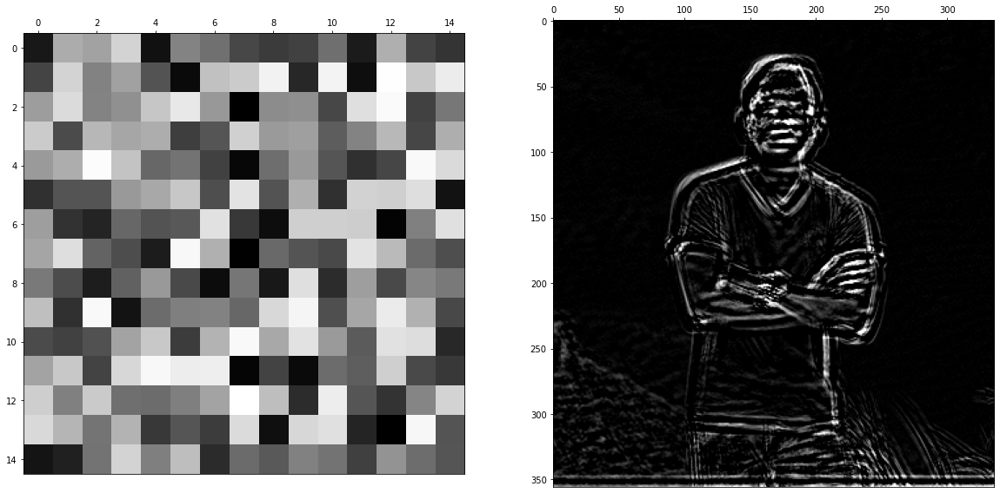

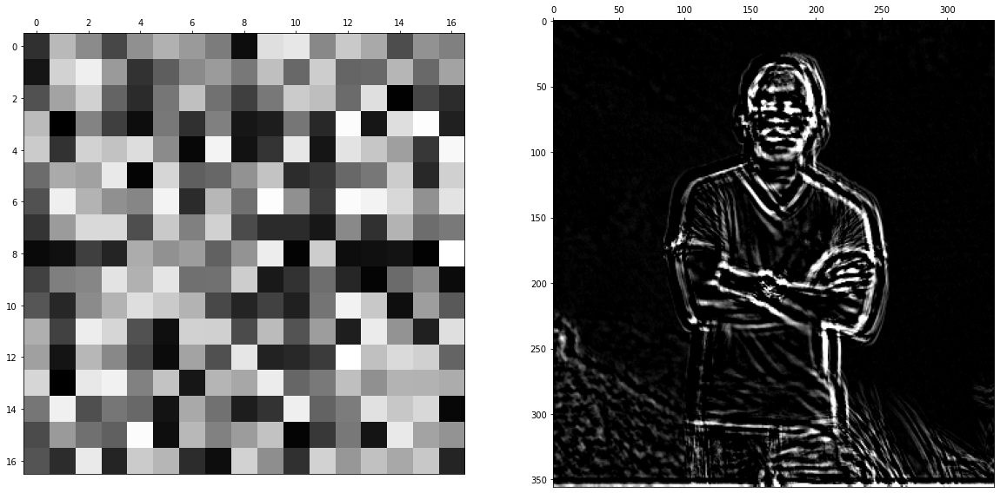

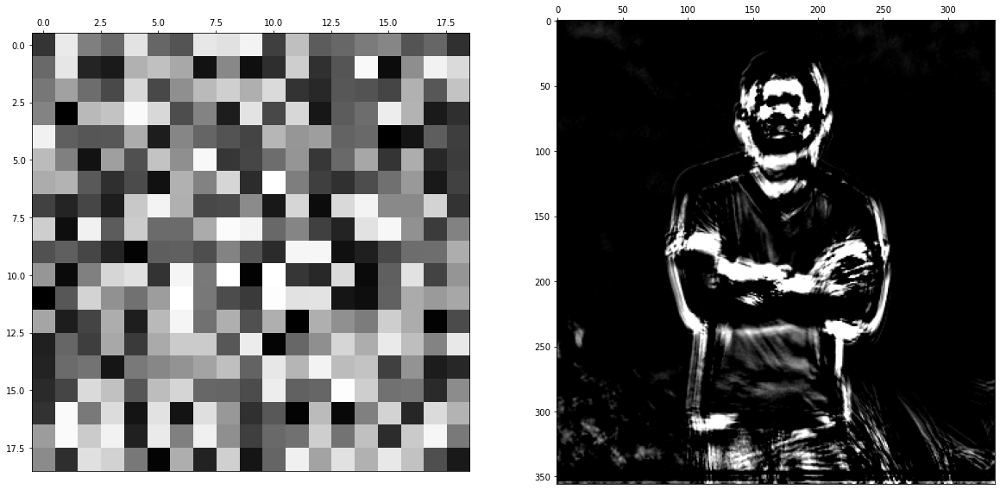

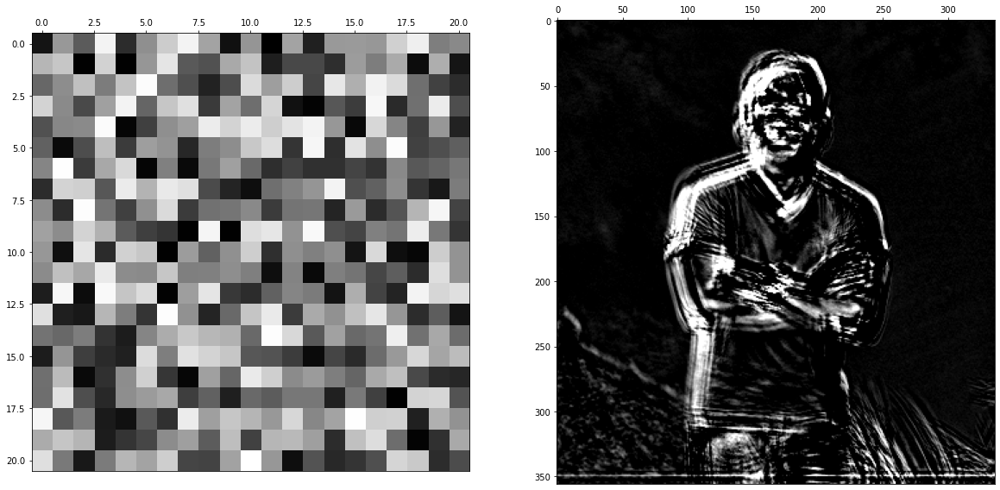

candidate kernel
[[-0.29819351  0.3285642  -0.19626896]
 [ 0.13230544  0.04858514 -0.35827566]
 [-0.12715537 -0.08137832  0.55181705]]
min error: 1076217


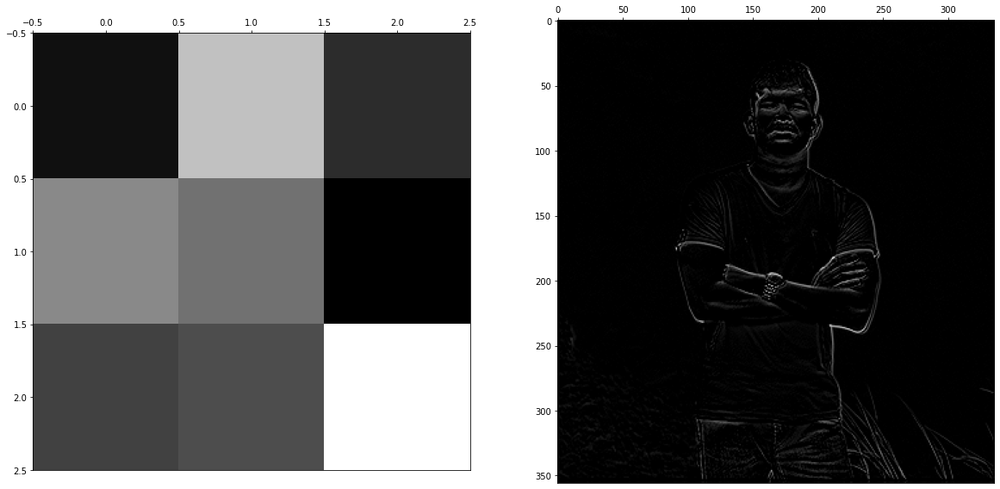

In [42]:
ksize = 31

img = cv.imread(base + "r3ki3g.jpeg",0)
hair = cv.imread(base + "r3ki3g-hair.jpeg",0)
assert hair is not None

minError = 0;
candidateKernel = np.zeros((ksize,ksize));
bestResult = 0;

for i in range(10):
    
    ksize = (i%15)*2+3
    kernel = np.random.rand(ksize,ksize)
    kernel -= np.sum(kernel)/ksize**2
    
    #impulse2D = np.zeros((ksize,ksize),dtype=np.float32)
    #impulse2D[ksize//2,ksize//2] = 1
    #print(impulse2D)
    #print(kernel)
#     inverse_kernel = sig.deconvolve(impulse2D,kernel)
    #print(kernel)

    dst = cv.filter2D(img,-1,kernel)
    error = np.sum((dst - hair)**2)
    
    if minError > error or not i:
        minError = error
        candidateKernel = kernel
        bestResult = dst
    fig,ax = plt.subplots(1,2,figsize=(20,10))
    ax[0].imshow(kernel,cmap= "gray")
    ax[1].imshow(dst,cmap="gray")
    ax[0].xaxis.tick_top()
    ax[1].xaxis.tick_top()
    plt.show()

print("candidate kernel")
print(candidateKernel)
print("min error:",minError)

fig,ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(candidateKernel,cmap= "gray")
ax[1].imshow(bestResult,cmap="gray")
ax[0].xaxis.tick_top()
ax[1].xaxis.tick_top()
plt.show()

## Fourier transform experiment


[[235 119 121 ... 212 121 119]
 [152  13 239 ...  59 228 161]
 [155  97 251 ... 134 134 215]
 ...
 [140 227 125 ...  56 251 145]
 [155 215 134 ... 152 251  97]
 [152 161 228 ...  69 239  13]]


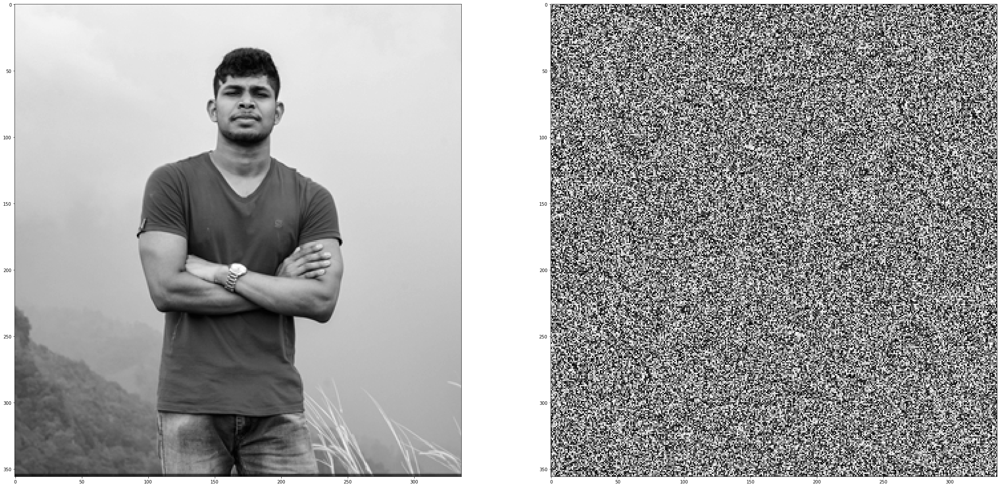

In [24]:
img = cv.imread(base + "r3ki3g.jpeg",0)
assert img is not None

f = np.fft.fft2(img)
mag = np.abs(f)
f_img = np.asarray(mag,dtype=np.uint8)
print(f_img)

fig,ax = plt.subplots(1,2,figsize=(40,40))
ax[0].imshow(img,cmap="gray")
ax[1].imshow(f_img,cmap="gray")

plt.show()

[[242 242 242 ... 229 229 230]
 [241 242 242 ... 229 230 230]
 [241 242 243 ... 230 231 231]
 ...
 [ 82  82  79 ... 163 174 160]
 [ 35  35  36 ...  71  77  72]
 [ 23  25  27 ...  56  63  64]]
mask (356, 336, 2)
f (356, 336, 2)
x shape (356, 336)
yshape (356, 336)
[[116.39554  116.3955   116.39553  ...  96.44452   96.44453   97.97922 ]
 [114.86087  116.39553  116.39554  ...  96.44455   97.97926   97.97928 ]
 [114.86083  116.39553  117.93023  ...  97.97922   99.51392   99.51391 ]
 ...
 [129.15524  129.15523  133.75934  ...   4.845181  12.036443   9.449238]
 [201.28572  201.28578  199.75105  ... 146.0368   136.82869  144.50215 ]
 [219.70204  216.6327   213.5633   ... 169.05725  158.31435  156.77963 ]]


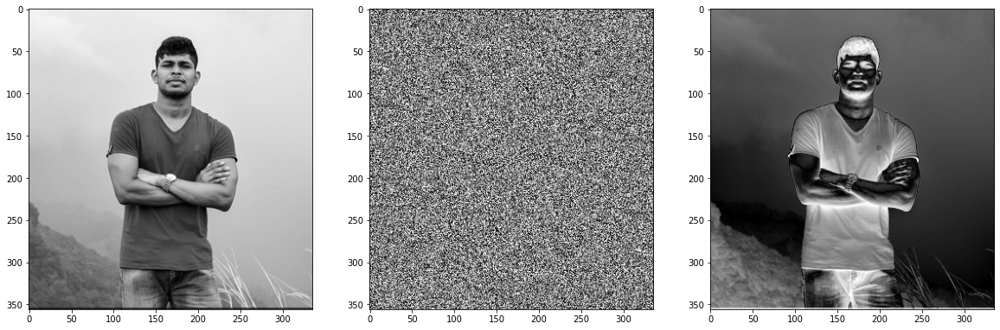

In [41]:
#image generation
# width=10
# height = 10


# img = np.array([[(((np.sin((2*np.pi/10)*(x))+1)*255/2))  for x in range(width)] for y in range(height)],
#                dtype=np.uint8)

img = cv.imread(base + "r3ki3g.jpeg",0)
assert img is not None


print(img)


f = cv.dft(img.astype(np.float32),flags=cv.DFT_COMPLEX_OUTPUT)
f = np.fft.fftshift(f)

mask = np.zeros(f.shape,np.float32)





X,Y = np.meshgrid(np.arange(f.shape[0])-f.shape[0]//2,np.arange(f.shape[1])-f.shape[1]//2,indexing="ij")

print("mask",mask.shape);
print("f",f.shape)

print("x shape",X.shape)
print("yshape",Y.shape)

radius1 = 0
radius2 = 1000
circle = np.logical_and((X**2 + Y**2 < radius2**2) ,(X**2 + Y**2 > radius1**2))
mask[circle] = [1,1]

f *= mask
mag = cv.magnitude(f[:,:,0],f[:,:,1])
f_img = np.asarray(mag,dtype=np.uint8)

f =  np.fft.ifftshift(f)
img_recreated = cv.idft(f)
img_recreated = cv.magnitude(img_recreated[:,:,0],img_recreated[:,:,1])
img_recreated *= 255/np.max(img_recreated)


print(img_recreated)
fig,ax = plt.subplots(1,3,figsize=(20,9))
ax[0].imshow(img,cmap="gray")
ax[1].imshow(f_img,cmap="gray")
ax[2].imshow(img_recreated,cmap="gray")

In [26]:
np.meshgrid([1,2,3,4],[7,8,9],indexing="xy")

[array([[1, 2, 3, 4],
        [1, 2, 3, 4],
        [1, 2, 3, 4]]),
 array([[7, 7, 7, 7],
        [8, 8, 8, 8],
        [9, 9, 9, 9]])]